In [48]:
import torch
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
import math
from tqdm import tqdm

In [49]:
# Random generators with random seeds
X_train_gen = torch.Generator()   
X_train_gen.manual_seed(1) 
X_test_gen = torch.Generator() 
Noise_gen = torch.Generator()
Noise_gen.manual_seed(2)
Sample_gen = torch.Generator()
Sample_gen.manual_seed(3)

In [50]:
device = "cpu"

In [ ]:
# helper functions
def mse(X,Y):
    losses = (X-Y)**2
    return losses.mean()

def single_index(n, d, gen, device="cpu"):
    theta = torch.ones(d)
    theta[1:] = 0
    X =  torch.normal(mean=0, std=1, size=(n,d), device = device, requires_grad=False, generator=gen)
    Y = X @ theta
    return X, Y

def var(X):
    return torch.var(X)
    
def second_moment(X):
    return var(X) + (torch.mean(X)) ** 2

In [52]:
# Parameters
mode = "ntk"
d = 20        # input dimension
m = 1000      # neuron width
n = 200       # number of data

eta_1 = 1e-3   # learning rate for W
eta_2 = 1e-3   # learning rate for a 

label_noise = True  # whether to use label noise
B = 1                # batch size
k_sigma = 4 * d      # label noise scale
k_1 = 1/d * k_sigma  # +- constant
epoch_num = 100001   # number of steps
criterion = mse      # loss function

In [53]:
class TwoLayerNN(nn.Module):
    def __init__(self, d, m, scale="ntk"):
        super(TwoLayerNN, self).__init__()
        W1_gen = torch.Generator()
        W1_gen.manual_seed(99) 
        W2_gen = torch.Generator()
        W2_gen.manual_seed(101)

        # Initialize W (m,d)
        W = torch.randn(m, d, generator=W1_gen) 
        W = W / (d ** 0.5)
        
        self.W = nn.Parameter(W, requires_grad=True)

        # Initialize a~N(0,1) (m,1)
        # a = 2 * torch.randint(0, 2, (m, 1), generator=W2_gen) - 1
        a = torch.randn(m, 1, generator=W2_gen)
        a = a / (m ** 0.5)
          
        self.a = nn.Parameter(a, requires_grad=True)
        self.scale = scale
        self.m = m

    def forward(self, X): #X:(n,d) W:(m,d) a:(m,1)
        output = X @ self.W.T @ self.a # shape: (T, n, m)
        return output

In [ ]:
# Generate training and test data
X_GD,Y_GD = single_index(n, d, X_train_gen, device=device)
X_test, Y_test = single_index(n,d,X_test_gen, device=device)
print(X_GD)
print(Y_GD[:10])
print(X_test)
print(Y_test[:10])

tensor([[-1.5256, -0.7502, -0.6540,  ..., -1.1608,  0.6995,  0.1991],
        [ 0.8657,  0.2444, -0.6629,  ...,  0.0457,  0.1530, -0.4757],
        [-0.1110,  0.2927, -0.1578,  ...,  0.9386, -0.1860, -0.6446],
        ...,
        [ 0.6381, -0.3540, -0.5431,  ...,  1.9151, -0.6811,  0.7034],
        [-0.8180, -0.4039, -1.2104,  ..., -1.0875, -0.2432, -0.0727],
        [ 0.0742,  0.5778, -1.0970,  ..., -1.1242,  0.9775,  0.7015]])
tensor([-1.5256,  0.8657, -0.1110,  1.5392, -0.5065,  1.3851,  2.5581,  2.2952,
         0.4175, -0.9640])
tensor([[-0.1737, -1.8225,  0.7792,  ..., -1.9745,  1.5358,  0.5033],
        [ 1.2364, -0.7147,  0.0041,  ..., -0.9549,  0.3995,  0.1250],
        [ 2.0879, -0.2450, -0.2927,  ...,  1.0148, -0.1364,  1.0802],
        ...,
        [-0.6677,  1.2787,  1.1509,  ..., -0.4065,  0.4354, -0.6589],
        [-0.1866, -1.1444, -1.3670,  ...,  0.4300, -2.3673,  0.1478],
        [ 0.5755, -0.4983, -0.9520,  ...,  0.9588, -0.6980, -0.3095]])
tensor([-0.1737,  1.2364,

In [55]:
# Create model
torch.cuda.empty_cache()
model = TwoLayerNN(d, m,scale=mode).to(device)

W1_list = []
W2_list = []

losses = []
total_losses = []
test_losses = []
indexes_large_loss = []

check_num = 248
check_pos = [i * (epoch_num // check_num) for i in range(check_num)]
check_idx = 0

print(check_pos)
print(model.a)

[0, 403, 806, 1209, 1612, 2015, 2418, 2821, 3224, 3627, 4030, 4433, 4836, 5239, 5642, 6045, 6448, 6851, 7254, 7657, 8060, 8463, 8866, 9269, 9672, 10075, 10478, 10881, 11284, 11687, 12090, 12493, 12896, 13299, 13702, 14105, 14508, 14911, 15314, 15717, 16120, 16523, 16926, 17329, 17732, 18135, 18538, 18941, 19344, 19747, 20150, 20553, 20956, 21359, 21762, 22165, 22568, 22971, 23374, 23777, 24180, 24583, 24986, 25389, 25792, 26195, 26598, 27001, 27404, 27807, 28210, 28613, 29016, 29419, 29822, 30225, 30628, 31031, 31434, 31837, 32240, 32643, 33046, 33449, 33852, 34255, 34658, 35061, 35464, 35867, 36270, 36673, 37076, 37479, 37882, 38285, 38688, 39091, 39494, 39897, 40300, 40703, 41106, 41509, 41912, 42315, 42718, 43121, 43524, 43927, 44330, 44733, 45136, 45539, 45942, 46345, 46748, 47151, 47554, 47957, 48360, 48763, 49166, 49569, 49972, 50375, 50778, 51181, 51584, 51987, 52390, 52793, 53196, 53599, 54002, 54405, 54808, 55211, 55614, 56017, 56420, 56823, 57226, 57629, 58032, 58435, 58838, 

In [56]:
# Specific neuron check setup
Spec_neuron_check_num = 3
W1_check_pos = [i * 299 for i in range(Spec_neuron_check_num)]
W2_check_pos = [i * 299 for i in range(Spec_neuron_check_num)]

Spec_neuron_check_num += 3
W1_check_pos.append(47)
W1_check_pos.append(62)
W1_check_pos.append(147)
W2_check_pos.append(47)
W2_check_pos.append(62)
W2_check_pos.append(147)

W1_spec_norm = []
W1_spec_cossim = []
W2_check_list = []
W1_W1pre_spec_vari = []
for i in range(Spec_neuron_check_num):
     W1_spec_norm.append([])
     W1_spec_cossim.append([])
     W2_check_list.append([])
     W1_W1pre_spec_vari.append([])

In [57]:
# initial value

W1_list.append(model.W.detach().clone())
W2_list.append(model.a.detach().clone())

In [58]:
# find the hign and low alignment neuron

high_value = 0.6
low_value = 0.01
count_1 = 0
count_2 = 0 
for i in range(m):
     # find the high alignment
     if abs(W1_list[0][i][0].item() / W1_list[0][i].norm().item()) > high_value and count_1 <= 2:
          Spec_neuron_check_num += 1
          count_1 += 1
          W1_check_pos.append(i)
          W2_check_pos.append(i)
          W1_spec_norm.append([])
          W1_spec_cossim.append([])
          W2_check_list.append([])
          W1_W1pre_spec_vari.append([])
          print(i, W1_list[0][i][0].item() / W1_list[0][i].norm().item())

     # find the low alignment
     if abs(W1_list[0][i][0].item() / W1_list[0][i].norm().item()) < low_value and count_2 <= 2:
          count_2 += 1
          Spec_neuron_check_num += 1
          W1_check_pos.append(i)
          W2_check_pos.append(i)
          W1_spec_norm.append([])
          W1_spec_cossim.append([])
          W2_check_list.append([])
          W1_W1pre_spec_vari.append([])
          print(i, W1_list[0][i][0].item() / W1_list[0][i].norm().item())

22 -0.002134498187899788
29 0.6000853499730193
47 0.7044816434854845
53 0.00406994566865859
83 -0.008769859984037584
172 0.6046099551697279


In [59]:
for i in range(Spec_neuron_check_num):
     W1_spec_norm[i].append(W1_list[0][W1_check_pos[i]].norm().item())
     W2_check_list[i].append(W2_list[0][W2_check_pos[i]].norm().item())
     W1_spec_cossim[i].append(W1_list[0][W1_check_pos[i]][0].item() / W1_list[0][W1_check_pos[i]].norm().item())
     W1_W1pre_spec_vari.append(W1_list[0][W1_check_pos[i]].norm().item())
     
check_idx += 1
print(W1_spec_norm)
print(W1_spec_cossim)
print(W2_check_list)

[[1.3369513750076294], [1.0153546333312988], [1.1327077150344849], [1.126628041267395], [1.2238123416900635], [1.1818344593048096], [1.033682107925415], [0.781599760055542], [1.126628041267395], [0.9336130023002625], [0.708724856376648], [0.9275426268577576]]
[[0.050085242869005626], [-0.28774544427344834], [-0.40970612958057284], [0.7044816434854845], [0.4234745056585365], [0.3615535378143072], [-0.002134498187899788], [0.6000853499730193], [0.7044816434854845], [0.00406994566865859], [-0.008769859984037584], [0.6046099551697279]]
[[0.019061025232076645], [0.007555644493550062], [0.01030791737139225], [0.017395110800862312], [0.017063898965716362], [0.012845659628510475], [0.017645273357629776], [0.030422911047935486], [0.017395110800862312], [0.028857743367552757], [0.05297310650348663], [0.02283947914838791]]


In [60]:
W1_norm_means = []
W2_norm_means = []
Cos_sim_abs_means = []
W1_pre = torch.zeros(m).unsqueeze(1)
W2_pre = torch.zeros(m).unsqueeze(1)

In [61]:
optimizer = optim.SGD([{'params': model.W, 'lr': eta_1},{'params': model.a, 'lr': eta_2}])
theta = torch.ones(d) # ground truth
theta[1:] = 0

X_pre = X_GD[0]
for i in tqdm(range(epoch_num)):
     model.zero_grad()
     with torch.no_grad():
          if check_idx < check_num and check_pos[check_idx] == i:
               W1_temp = model.W.detach().clone()
               W2_temp = model.a.detach().clone()
               W1_list.append(W1_temp)
               W2_list.append(W2_temp)
               check_idx += 1

     indices = torch.randperm(n, generator = Sample_gen)[:B]

     X = X_GD[indices,:]
     Y = Y_GD[indices]

     N = 2 * torch.randint(0, 2, (B,1), generator = Noise_gen).squeeze() - 1
     Y_noisy = Y + k_1 * N
     
     output = model(X).squeeze()
     loss = criterion(output,Y_noisy)
     
     Y_tmp = model(X_GD).squeeze()
     Y_tmp_test = model(X_test).squeeze()

     with torch.no_grad():
          losses.append(loss.item())
          total_losses.append(criterion(Y_tmp, Y_GD).item())
          test_losses.append(criterion(Y_tmp_test, Y_test).item())
          if loss.item() > 1:
               indexes_large_loss.append(i)

          W1_temp = model.W.detach().clone()
          W2_temp = model.a.detach().clone()

          # compute the mean
          W1_norms = torch.norm(W1_temp, dim=1)
          mean_norm = W1_norms.mean()
          W1_norm_means.append(mean_norm.item())

          W2_norms = torch.norm(W2_temp, dim=1)
          mean_norm = W2_norms.mean().item() 
          W2_norm_means.append(mean_norm)

          r1 = torch.abs(W1_temp[:, :1] / W1_norms.unsqueeze(1))  # theta = [1,0,0,...,0]
          r1_mean = r1.mean().item()
          Cos_sim_abs_means.append(r1_mean)

          for j in range(Spec_neuron_check_num):
               W2_check_list[j].append(W2_temp[W2_check_pos[j]].item())
               W1_spec_norm[j].append(W1_temp[W1_check_pos[j]].norm().item())
               W1_spec_cossim[j].append(W1_temp[W1_check_pos[j]][0].item() / W1_temp[W1_check_pos[j]].norm().item())
               W1_W1pre_spec_vari[j].append((W1_temp[W2_check_pos[j]] * W1_pre[W2_check_pos[j]]).sum().item())

          W1_pre = W1_temp
          W2_pre = W2_temp
               
     loss.backward()
     optimizer.step()

     if(i % 1000 == 0):
          with torch.no_grad():
               print("loss:",criterion(model(X).squeeze(),Y))
               print("total_loss:",criterion(Y_tmp, Y_GD))
               print("test_loss:",criterion(Y_tmp_test, Y_test))
model.zero_grad()

  0%|          | 0/100001 [00:00<?, ?it/s]

loss: tensor(37.1374)
total_loss: tensor(1.2010)
test_loss: tensor(1.2349)


  1%|          | 1049/100001 [00:04<06:29, 254.00it/s]

loss: tensor(23.7367)
total_loss: tensor(23.6162)
test_loss: tensor(28.6830)


  2%|▏         | 2046/100001 [00:08<06:04, 268.39it/s]

loss: tensor(15.5955)
total_loss: tensor(16.2476)
test_loss: tensor(18.5304)


  3%|▎         | 3036/100001 [00:12<06:38, 243.59it/s]

loss: tensor(9.7778)
total_loss: tensor(9.2465)
test_loss: tensor(10.5581)


  4%|▍         | 4024/100001 [00:16<06:50, 233.99it/s]

loss: tensor(16.3933)
total_loss: tensor(7.7952)
test_loss: tensor(9.0526)


  5%|▌         | 5030/100001 [00:19<06:06, 258.81it/s]

loss: tensor(7.0910)
total_loss: tensor(8.6400)
test_loss: tensor(7.1650)


  6%|▌         | 6040/100001 [00:23<05:10, 302.78it/s]

loss: tensor(8.1603)
total_loss: tensor(7.0079)
test_loss: tensor(7.2678)


  7%|▋         | 7038/100001 [00:28<05:41, 272.27it/s]

loss: tensor(0.0509)
total_loss: tensor(7.0407)
test_loss: tensor(6.0716)


  8%|▊         | 8049/100001 [00:32<05:25, 282.33it/s]

loss: tensor(3.3982)
total_loss: tensor(5.1507)
test_loss: tensor(5.5877)


  9%|▉         | 9030/100001 [00:35<04:39, 325.80it/s]

loss: tensor(8.1617)
total_loss: tensor(6.1446)
test_loss: tensor(6.9230)


 10%|█         | 10044/100001 [00:39<04:57, 302.54it/s]

loss: tensor(2.6190)
total_loss: tensor(4.8121)
test_loss: tensor(4.8497)


 11%|█         | 11048/100001 [00:42<04:54, 302.15it/s]

loss: tensor(5.4439)
total_loss: tensor(3.7801)
test_loss: tensor(3.7569)


 12%|█▏        | 12025/100001 [00:46<09:21, 156.66it/s]

loss: tensor(10.1862)
total_loss: tensor(4.2532)
test_loss: tensor(5.0852)


 13%|█▎        | 13022/100001 [00:51<10:59, 131.91it/s]

loss: tensor(0.2002)
total_loss: tensor(4.4709)
test_loss: tensor(5.5446)


 14%|█▍        | 14033/100001 [00:56<05:33, 257.63it/s]

loss: tensor(0.1563)
total_loss: tensor(3.9837)
test_loss: tensor(4.5479)


 15%|█▌        | 15014/100001 [01:03<10:44, 131.94it/s]

loss: tensor(4.9583)
total_loss: tensor(2.3575)
test_loss: tensor(2.0561)


 16%|█▌        | 16035/100001 [01:09<07:07, 196.39it/s]

loss: tensor(9.5124)
total_loss: tensor(1.9604)
test_loss: tensor(2.5342)


 17%|█▋        | 17050/100001 [01:14<05:16, 262.25it/s]

loss: tensor(7.5435)
total_loss: tensor(2.3068)
test_loss: tensor(2.1009)


 18%|█▊        | 18030/100001 [01:19<07:40, 177.98it/s]

loss: tensor(0.1543)
total_loss: tensor(2.3578)
test_loss: tensor(2.4611)


 19%|█▉        | 19022/100001 [01:24<05:35, 241.33it/s]

loss: tensor(0.3675)
total_loss: tensor(2.9658)
test_loss: tensor(3.6680)


 20%|██        | 20038/100001 [01:29<05:25, 245.83it/s]

loss: tensor(1.5025e-05)
total_loss: tensor(1.8597)
test_loss: tensor(2.2347)


 21%|██        | 21029/100001 [01:33<08:01, 163.96it/s]

loss: tensor(6.1434)
total_loss: tensor(1.7568)
test_loss: tensor(2.1998)


 22%|██▏       | 22042/100001 [01:39<06:19, 205.43it/s]

loss: tensor(1.1565)
total_loss: tensor(2.0010)
test_loss: tensor(2.4313)


 23%|██▎       | 23024/100001 [01:42<04:38, 276.39it/s]

loss: tensor(0.6183)
total_loss: tensor(0.8822)
test_loss: tensor(1.0765)


 24%|██▍       | 24044/100001 [01:47<05:51, 215.99it/s]

loss: tensor(1.3648)
total_loss: tensor(0.9554)
test_loss: tensor(1.2506)


 25%|██▌       | 25036/100001 [01:51<04:54, 254.37it/s]

loss: tensor(2.5480)
total_loss: tensor(0.5110)
test_loss: tensor(0.6466)


 26%|██▌       | 26038/100001 [01:55<05:04, 242.99it/s]

loss: tensor(0.7890)
total_loss: tensor(2.6398)
test_loss: tensor(2.9672)


 27%|██▋       | 27030/100001 [01:59<04:28, 271.47it/s]

loss: tensor(0.0728)
total_loss: tensor(1.9415)
test_loss: tensor(2.0680)


 28%|██▊       | 28048/100001 [02:04<04:41, 255.60it/s]

loss: tensor(1.3059)
total_loss: tensor(0.4881)
test_loss: tensor(0.5312)


 29%|██▉       | 29029/100001 [02:09<08:39, 136.70it/s]

loss: tensor(2.2229)
total_loss: tensor(1.7242)
test_loss: tensor(2.1451)


 30%|███       | 30016/100001 [02:14<05:59, 194.91it/s]

loss: tensor(0.8465)
total_loss: tensor(1.3638)
test_loss: tensor(1.5916)


 31%|███       | 31028/100001 [02:19<05:10, 221.90it/s]

loss: tensor(2.6132)
total_loss: tensor(0.5606)
test_loss: tensor(0.5503)


 32%|███▏      | 32018/100001 [02:23<04:25, 256.41it/s]

loss: tensor(0.0337)
total_loss: tensor(0.4777)
test_loss: tensor(0.5075)


 33%|███▎      | 33059/100001 [02:27<04:09, 268.59it/s]

loss: tensor(0.0036)
total_loss: tensor(1.7166)
test_loss: tensor(1.6939)


 34%|███▍      | 34043/100001 [02:31<04:09, 263.84it/s]

loss: tensor(0.0118)
total_loss: tensor(0.5830)
test_loss: tensor(0.4847)


 35%|███▌      | 35025/100001 [02:35<05:06, 211.73it/s]

loss: tensor(0.4300)
total_loss: tensor(0.7337)
test_loss: tensor(0.7510)


 36%|███▌      | 36032/100001 [02:40<05:09, 206.49it/s]

loss: tensor(0.8430)
total_loss: tensor(0.9440)
test_loss: tensor(1.3481)


 37%|███▋      | 37037/100001 [02:44<04:05, 256.20it/s]

loss: tensor(0.2019)
total_loss: tensor(0.4975)
test_loss: tensor(0.6032)


 38%|███▊      | 38051/100001 [02:48<03:32, 292.11it/s]

loss: tensor(0.6844)
total_loss: tensor(0.7673)
test_loss: tensor(0.6190)


 39%|███▉      | 39052/100001 [02:51<03:44, 271.61it/s]

loss: tensor(5.3805)
total_loss: tensor(1.4481)
test_loss: tensor(2.2389)


 40%|████      | 40042/100001 [02:55<03:17, 303.24it/s]

loss: tensor(0.0014)
total_loss: tensor(0.7134)
test_loss: tensor(0.9090)


 41%|████      | 41024/100001 [02:59<05:00, 196.22it/s]

loss: tensor(3.9721)
total_loss: tensor(0.7160)
test_loss: tensor(0.8808)


 42%|████▏     | 42030/100001 [03:04<04:17, 225.20it/s]

loss: tensor(0.7649)
total_loss: tensor(0.5255)
test_loss: tensor(0.7857)


 43%|████▎     | 43042/100001 [03:08<03:30, 270.89it/s]

loss: tensor(0.1550)
total_loss: tensor(0.4169)
test_loss: tensor(0.5080)


 44%|████▍     | 44041/100001 [03:13<03:34, 260.54it/s]

loss: tensor(1.1204)
total_loss: tensor(0.5430)
test_loss: tensor(0.8006)


 45%|████▌     | 45051/100001 [03:17<03:30, 260.85it/s]

loss: tensor(0.3424)
total_loss: tensor(0.5968)
test_loss: tensor(0.7973)


 46%|████▌     | 46047/100001 [03:22<04:30, 199.29it/s]

loss: tensor(0.0886)
total_loss: tensor(0.3872)
test_loss: tensor(0.4495)


 47%|████▋     | 47024/100001 [03:27<03:58, 222.06it/s]

loss: tensor(0.3314)
total_loss: tensor(0.5606)
test_loss: tensor(0.6122)


 48%|████▊     | 48061/100001 [03:32<03:08, 275.54it/s]

loss: tensor(0.1958)
total_loss: tensor(0.2349)
test_loss: tensor(0.2729)


 49%|████▉     | 49040/100001 [03:37<03:32, 239.78it/s]

loss: tensor(0.0910)
total_loss: tensor(0.4926)
test_loss: tensor(0.5326)


 50%|█████     | 50049/100001 [03:41<04:42, 176.60it/s]

loss: tensor(0.1973)
total_loss: tensor(0.6389)
test_loss: tensor(0.8986)


 51%|█████     | 51023/100001 [03:46<03:35, 227.17it/s]

loss: tensor(0.1171)
total_loss: tensor(0.7050)
test_loss: tensor(0.8017)


 52%|█████▏    | 52019/100001 [03:51<04:11, 190.71it/s]

loss: tensor(0.0007)
total_loss: tensor(0.4242)
test_loss: tensor(0.3133)


 53%|█████▎    | 53039/100001 [03:59<04:52, 160.72it/s]

loss: tensor(1.2644)
total_loss: tensor(0.3300)
test_loss: tensor(0.4545)


 54%|█████▍    | 54034/100001 [04:05<03:17, 232.62it/s]

loss: tensor(0.4045)
total_loss: tensor(0.5542)
test_loss: tensor(0.7663)


 55%|█████▌    | 55027/100001 [04:10<03:22, 221.68it/s]

loss: tensor(0.8477)
total_loss: tensor(0.4602)
test_loss: tensor(0.4682)


 56%|█████▌    | 56006/100001 [04:17<04:14, 172.65it/s]

loss: tensor(1.2191)
total_loss: tensor(0.4216)
test_loss: tensor(0.7175)


 57%|█████▋    | 57031/100001 [04:22<02:48, 255.18it/s]

loss: tensor(0.0003)
total_loss: tensor(0.3039)
test_loss: tensor(0.4022)


 58%|█████▊    | 58048/100001 [04:27<03:48, 183.38it/s]

loss: tensor(0.5259)
total_loss: tensor(0.4783)
test_loss: tensor(0.7032)


 59%|█████▉    | 59014/100001 [04:32<03:12, 212.70it/s]

loss: tensor(0.2268)
total_loss: tensor(0.9934)
test_loss: tensor(1.1124)


 60%|██████    | 60061/100001 [04:37<02:09, 309.07it/s]

loss: tensor(2.1308)
total_loss: tensor(0.7296)
test_loss: tensor(0.8217)


 61%|██████    | 61031/100001 [04:41<03:42, 174.78it/s]

loss: tensor(0.0005)
total_loss: tensor(0.2968)
test_loss: tensor(0.2676)


 62%|██████▏   | 62044/100001 [04:46<02:33, 247.85it/s]

loss: tensor(0.0084)
total_loss: tensor(0.3374)
test_loss: tensor(0.4358)


 63%|██████▎   | 63035/100001 [04:51<02:50, 217.40it/s]

loss: tensor(0.0318)
total_loss: tensor(0.2115)
test_loss: tensor(0.2369)


 64%|██████▍   | 64053/100001 [04:55<02:08, 279.13it/s]

loss: tensor(0.1966)
total_loss: tensor(0.2418)
test_loss: tensor(0.2928)


 65%|██████▌   | 65028/100001 [04:59<02:18, 253.08it/s]

loss: tensor(0.2185)
total_loss: tensor(0.3739)
test_loss: tensor(0.3523)


 66%|██████▌   | 66013/100001 [05:04<01:54, 295.56it/s]

loss: tensor(4.0766e-05)
total_loss: tensor(0.1877)
test_loss: tensor(0.1867)


 67%|██████▋   | 67044/100001 [05:08<02:14, 245.90it/s]

loss: tensor(0.0011)
total_loss: tensor(0.3930)
test_loss: tensor(0.4274)


 68%|██████▊   | 68013/100001 [05:12<03:46, 141.36it/s]

loss: tensor(0.7629)
total_loss: tensor(0.6860)
test_loss: tensor(0.9053)


 69%|██████▉   | 69039/100001 [05:18<03:04, 167.85it/s]

loss: tensor(0.0445)
total_loss: tensor(0.1815)
test_loss: tensor(0.1816)


 70%|███████   | 70059/100001 [05:22<01:48, 275.21it/s]

loss: tensor(0.3096)
total_loss: tensor(0.6617)
test_loss: tensor(0.6921)


 71%|███████   | 71033/100001 [05:26<01:45, 274.55it/s]

loss: tensor(0.0700)
total_loss: tensor(0.3270)
test_loss: tensor(0.3819)


 72%|███████▏  | 72059/100001 [05:30<01:40, 279.30it/s]

loss: tensor(0.0178)
total_loss: tensor(0.4932)
test_loss: tensor(0.4223)


 73%|███████▎  | 73037/100001 [05:35<02:11, 205.27it/s]

loss: tensor(0.0011)
total_loss: tensor(0.3074)
test_loss: tensor(0.4305)


 74%|███████▍  | 74044/100001 [05:39<01:32, 279.79it/s]

loss: tensor(3.5896)
total_loss: tensor(0.5752)
test_loss: tensor(0.6739)


 75%|███████▌  | 75043/100001 [05:43<01:31, 273.31it/s]

loss: tensor(0.0527)
total_loss: tensor(0.3018)
test_loss: tensor(0.3807)


 76%|███████▌  | 75996/100001 [05:48<01:25, 279.35it/s]

loss: tensor(0.6371)
total_loss: tensor(0.2476)
test_loss: tensor(0.2949)


 77%|███████▋  | 77032/100001 [05:51<01:20, 285.33it/s]

loss: tensor(0.7657)
total_loss: tensor(0.3223)
test_loss: tensor(0.3199)


 78%|███████▊  | 78047/100001 [05:55<01:20, 274.27it/s]

loss: tensor(0.0782)
total_loss: tensor(0.4083)
test_loss: tensor(0.4107)


 79%|███████▉  | 79054/100001 [05:58<01:13, 286.54it/s]

loss: tensor(0.0226)
total_loss: tensor(0.2867)
test_loss: tensor(0.3761)


 80%|████████  | 80027/100001 [06:02<01:07, 296.61it/s]

loss: tensor(0.0341)
total_loss: tensor(0.1705)
test_loss: tensor(0.2150)


 81%|████████  | 81035/100001 [06:05<00:57, 332.32it/s]

loss: tensor(0.0499)
total_loss: tensor(0.1669)
test_loss: tensor(0.1759)


 82%|████████▏ | 82036/100001 [06:08<00:47, 382.03it/s]

loss: tensor(0.3519)
total_loss: tensor(0.3114)
test_loss: tensor(0.3013)


 83%|████████▎ | 83070/100001 [06:11<00:41, 410.27it/s]

loss: tensor(0.0022)
total_loss: tensor(0.4654)
test_loss: tensor(0.5981)


 84%|████████▍ | 84089/100001 [06:14<00:47, 337.02it/s]

loss: tensor(0.0839)
total_loss: tensor(0.1909)
test_loss: tensor(0.1737)


 85%|████████▌ | 85059/100001 [06:17<00:40, 368.32it/s]

loss: tensor(0.0415)
total_loss: tensor(0.1988)
test_loss: tensor(0.2274)


 86%|████████▌ | 86057/100001 [06:19<00:32, 434.15it/s]

loss: tensor(0.1055)
total_loss: tensor(0.1673)
test_loss: tensor(0.1995)


 87%|████████▋ | 87077/100001 [06:21<00:25, 507.79it/s]

loss: tensor(0.0813)
total_loss: tensor(0.2313)
test_loss: tensor(0.2421)


 88%|████████▊ | 88061/100001 [06:23<00:23, 511.83it/s]

loss: tensor(0.6941)
total_loss: tensor(0.2034)
test_loss: tensor(0.3095)


 89%|████████▉ | 89056/100001 [06:26<00:31, 345.69it/s]

loss: tensor(0.5165)
total_loss: tensor(0.2944)
test_loss: tensor(0.2616)


 90%|█████████ | 90049/100001 [06:30<00:29, 340.09it/s]

loss: tensor(0.8801)
total_loss: tensor(0.3427)
test_loss: tensor(0.3387)


 91%|█████████ | 91037/100001 [06:33<00:26, 340.33it/s]

loss: tensor(0.0582)
total_loss: tensor(0.2899)
test_loss: tensor(0.2888)


 92%|█████████▏| 92053/100001 [06:36<00:21, 364.46it/s]

loss: tensor(0.3476)
total_loss: tensor(0.1996)
test_loss: tensor(0.2243)


 93%|█████████▎| 93033/100001 [06:39<00:30, 228.91it/s]

loss: tensor(0.0013)
total_loss: tensor(0.3071)
test_loss: tensor(0.3112)


 94%|█████████▍| 94035/100001 [06:42<00:19, 309.78it/s]

loss: tensor(0.1185)
total_loss: tensor(0.1939)
test_loss: tensor(0.2227)


 95%|█████████▌| 95064/100001 [06:45<00:15, 321.14it/s]

loss: tensor(0.0590)
total_loss: tensor(0.1048)
test_loss: tensor(0.1020)


 96%|█████████▌| 96030/100001 [06:49<00:19, 201.94it/s]

loss: tensor(0.0089)
total_loss: tensor(0.1117)
test_loss: tensor(0.1186)


 97%|█████████▋| 97025/100001 [06:53<00:08, 342.93it/s]

loss: tensor(0.0796)
total_loss: tensor(0.3105)
test_loss: tensor(0.3435)


 98%|█████████▊| 98027/100001 [06:56<00:07, 270.27it/s]

loss: tensor(0.0198)
total_loss: tensor(0.0753)
test_loss: tensor(0.1073)


 99%|█████████▉| 99012/100001 [07:00<00:04, 235.21it/s]

loss: tensor(0.1329)
total_loss: tensor(0.2569)
test_loss: tensor(0.2852)


100%|██████████| 100001/100001 [07:04<00:00, 235.60it/s]

loss: tensor(0.1436)
total_loss: tensor(0.2262)
test_loss: tensor(0.2543)


In [62]:
# W1 aligment
theta = torch.ones(d)
theta[1:] = 0
W1_norm_list = []
W1_cos_list = []
for num in range(check_num):
     W1_norm = [W1_list[num][i].norm().item() for i in range(m)]
     W1_cos = (W1_list[num] @ theta).detach().numpy() 
     W1_cos = [W1_cos[i] / W1_list[num][i].norm().item() for i in range(m)]
     W1_norm_list.append(W1_norm)
     W1_cos_list.append(W1_cos)

In [63]:
# W2 observe
print(W2_list[3])
for num in range(check_num):
     W2_list[num] = W2_list[num].view(-1).tolist()
     
W2_x = [j for j in range(m)]
print(W2_x)
print(W2_list[1])

tensor([[-1.6672e-02],
        [-8.0176e-03],
        [ 1.6980e-02],
        [ 5.5753e-04],
        [ 1.7675e-02],
        [-4.3546e-02],
        [-6.9154e-03],
        [ 8.8670e-03],
        [ 6.1831e-02],
        [-1.4514e-02],
        [-3.6365e-03],
        [ 2.4584e-03],
        [ 1.5959e-04],
        [-4.0935e-02],
        [ 3.0660e-03],
        [-1.6973e-02],
        [-3.9932e-02],
        [ 7.5346e-03],
        [-1.8903e-02],
        [ 1.2743e-03],
        [-1.9940e-02],
        [-1.8825e-02],
        [ 2.6639e-02],
        [-1.3028e-02],
        [-3.9675e-02],
        [-3.7213e-02],
        [ 1.0038e-02],
        [ 1.9419e-02],
        [ 4.1496e-02],
        [ 8.0046e-03],
        [ 4.0855e-02],
        [-3.0229e-02],
        [-1.5641e-02],
        [ 2.4672e-02],
        [ 1.2067e-02],
        [ 1.6576e-02],
        [-7.0972e-03],
        [ 1.3730e-02],
        [ 1.0152e-02],
        [ 9.5672e-03],
        [-1.4475e-02],
        [-1.4116e-04],
        [-3.7167e-03],
        [ 3

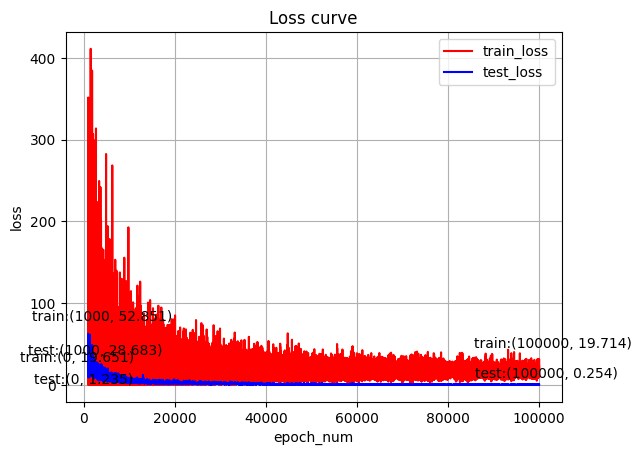

In [64]:
# plot loss

import matplotlib.pyplot as plt
plt.figure()  
start = 1000
end = epoch_num
mid_point = 1000
x = range(0,epoch_num)
plt.plot(x[start:end], losses[start:end], label='train_loss', color='red')
plt.plot(x[start:end], test_losses[start:end], label = 'test_loss', color='blue')
plt.annotate(f'train:({x[0]}, {losses[0]:.3f})',  
                 (x[0], losses[0]),
                 textcoords="offset points",     
                 xytext=(-5, 5),        
                 ha='center') 
plt.annotate(f'test:({x[0]}, {test_losses[0]:.3f})',  
                 (x[0], test_losses[0]),  
                 textcoords="offset points",     
                 xytext=(0,0),      
                 ha='center') 
plt.annotate(f'train:({x[mid_point]}, {losses[mid_point]:.3f})',  
                 (x[mid_point], losses[mid_point]),       
                 textcoords="offset points",     
                 xytext=(10, 15),             
                 ha='center') 
plt.annotate(f'test:({x[mid_point]}, {test_losses[mid_point]:.3f})',  
                 (x[mid_point], test_losses[mid_point]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center')  
plt.annotate(f'train:({x[epoch_num - 1]}, {losses[epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], losses[epoch_num - 1]),       
                 textcoords="offset points",     
                 xytext=(10, 15),             
                 ha='center') 
plt.annotate(f'test:({x[epoch_num - 1]}, {test_losses[epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], test_losses[epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)      
plt.title('Loss curve')
plt.xlabel('epoch_num')
plt.ylabel('loss')
plt.legend()
plt.grid(True)
plt.show() 

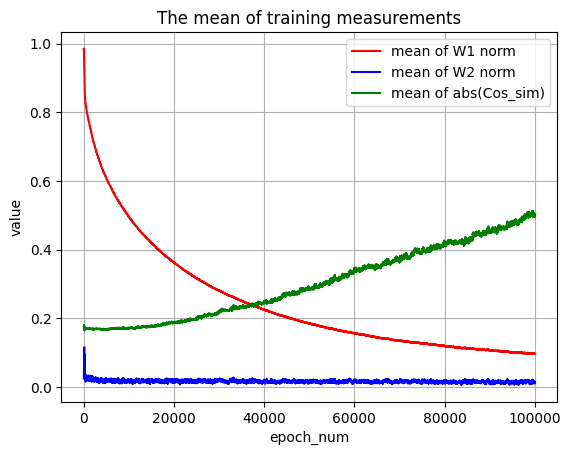

[0.02478337474167347, 0.02532142959535122, 0.026130428537726402, 0.027556460350751877, 0.0276737492531538, 0.02794557623565197, 0.02866423688828945, 0.028847210109233856, 0.028638627380132675, 0.02904163859784603, 0.031662218272686005, 0.0317976288497448, 0.03220580890774727, 0.033019132912158966, 0.039019957184791565, 0.03892023116350174, 0.03881659731268883, 0.038353342562913895, 0.03660440817475319, 0.033850718289613724, 0.03313815966248512, 0.033240944147109985, 0.0332048200070858, 0.034590814262628555, 0.0326683484017849, 0.032905757427215576, 0.03404684737324715, 0.03431178256869316, 0.03877493366599083, 0.038582365959882736, 0.03932059928774834, 0.04021809622645378, 0.04350756108760834, 0.0447813980281353, 0.04946531727910042, 0.04938994348049164, 0.046164561063051224, 0.04660434275865555, 0.047271646559238434, 0.04724650830030441, 0.05475880205631256, 0.05682471767067909, 0.05658542364835739, 0.055760640650987625, 0.05821075290441513, 0.05861876159906387, 0.07252015918493271, 0

In [65]:
import matplotlib.pyplot as plt
W2_div_W1 = [W2_norm_means[i] / W1_norm_means[i] for i in range(epoch_num)]
plt.figure()  
start = 0
end = epoch_num
x = range(start, end)
plt.plot(x, W1_norm_means[start: end], label='mean of W1 norm', color='red')
plt.plot(x, W2_norm_means[start:end], label='mean of W2 norm', color='blue')
plt.plot(x, Cos_sim_abs_means[start:end], label='mean of abs(Cos_sim)', color='green')
plt.title('The mean of training measurements')
plt.xlabel('epoch_num')
plt.ylabel('value')
# plt.ylim(0,1)
plt.legend()
plt.grid(True)
plt.show() 

print(W2_norm_means[0:2000])
print(W1_norm_means[0])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


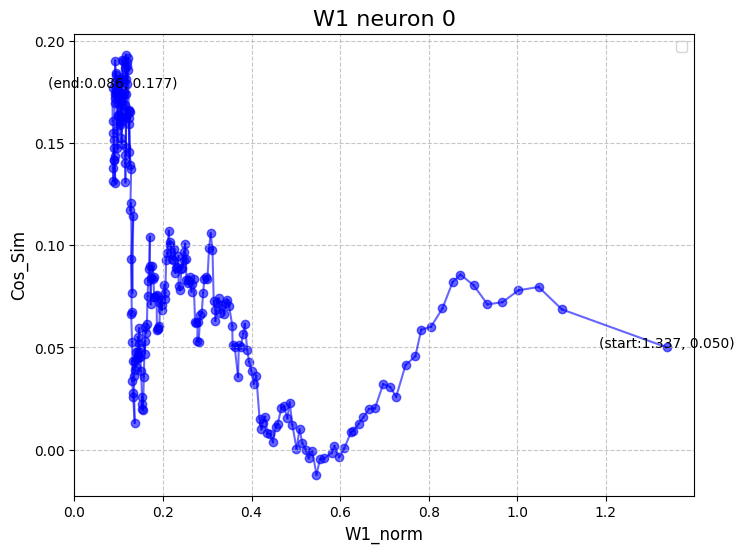

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


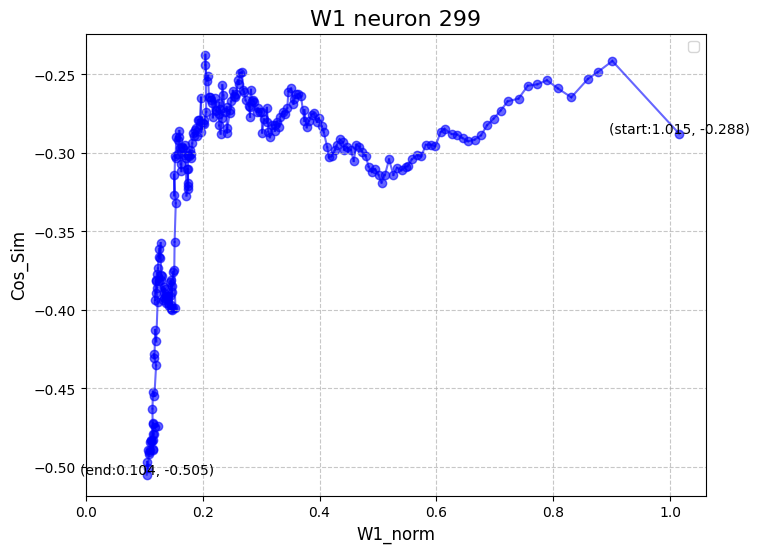

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


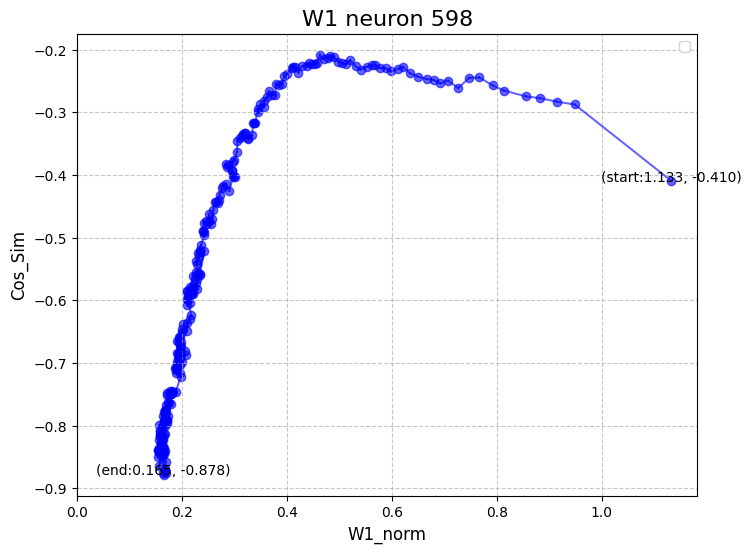

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


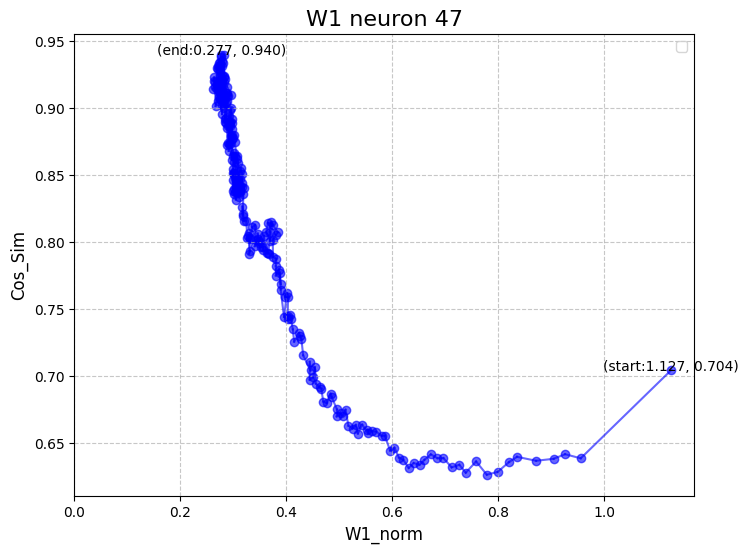

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


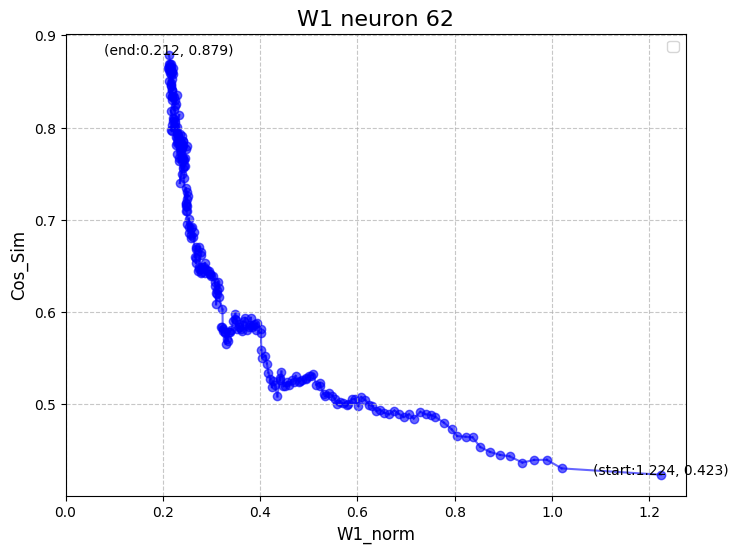

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


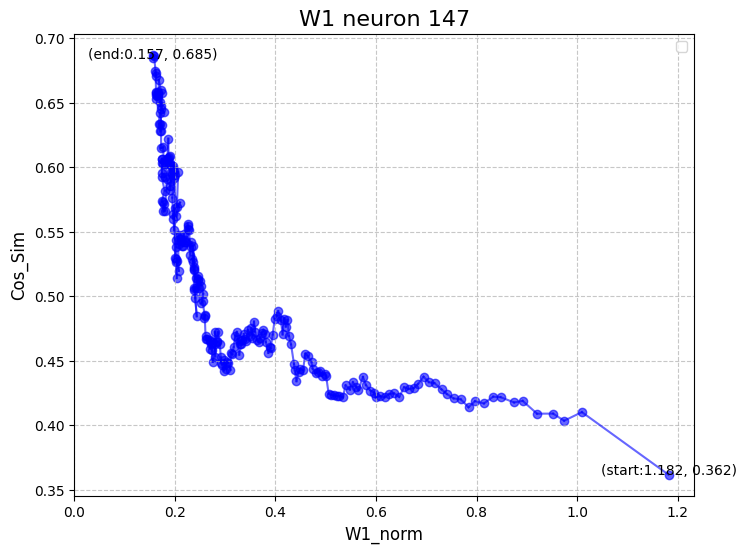

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


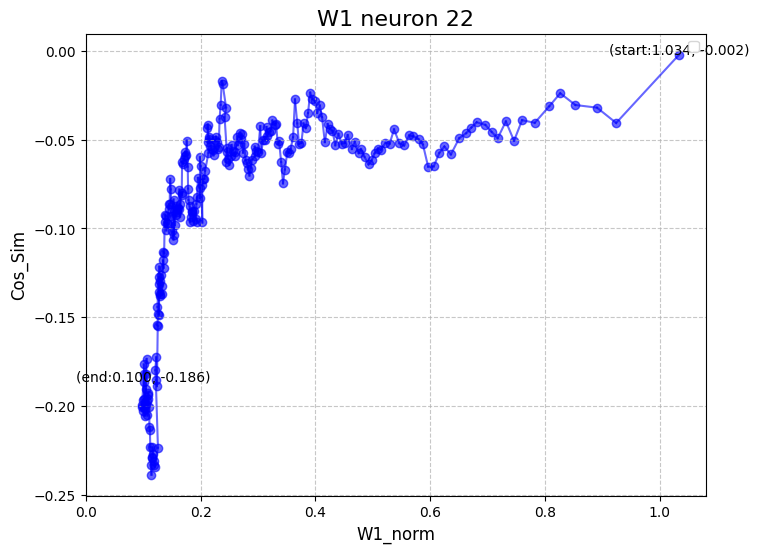

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


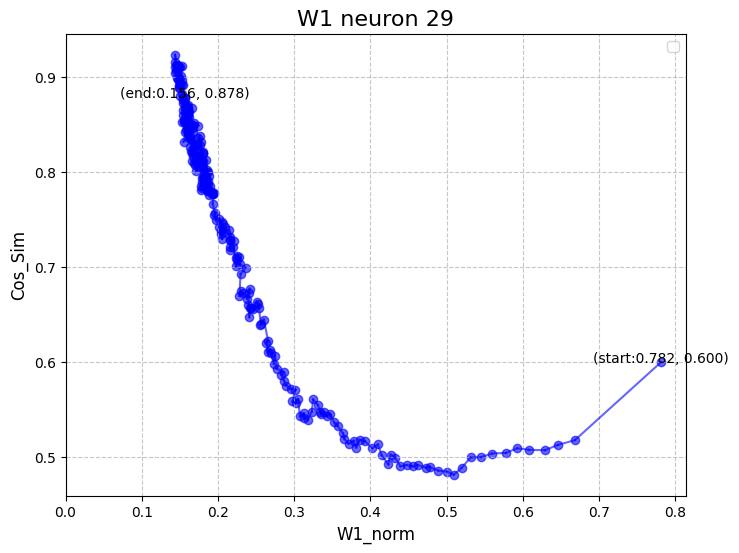

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


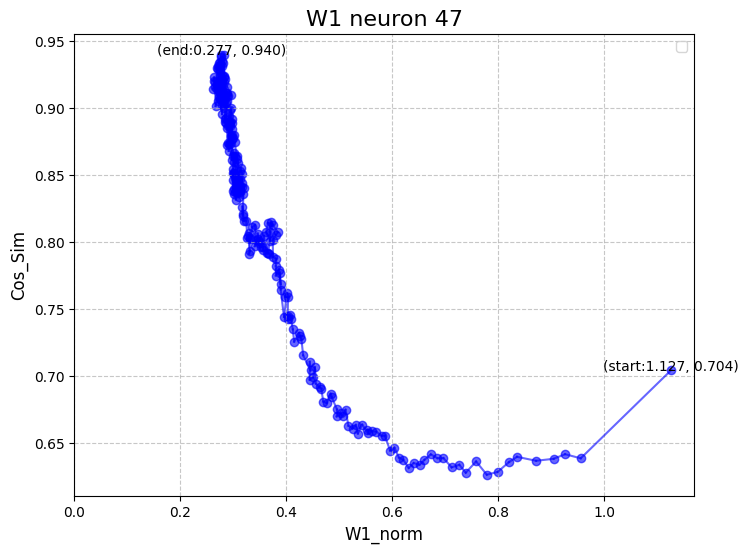

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


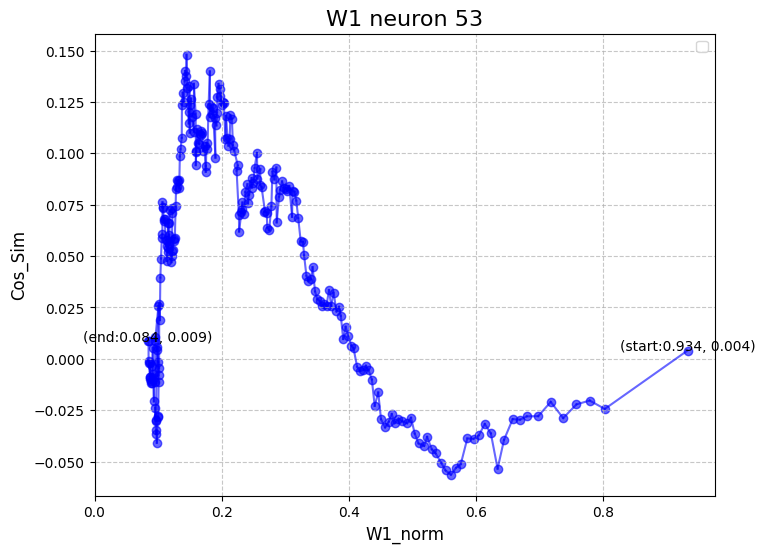

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


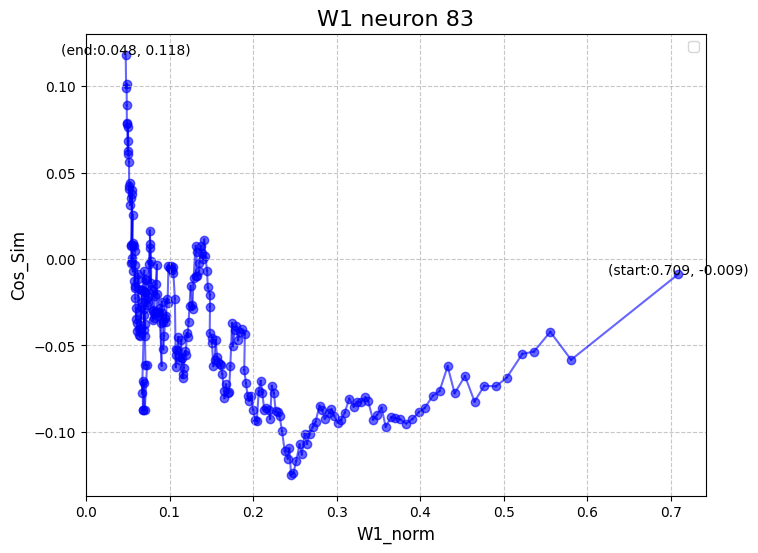

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


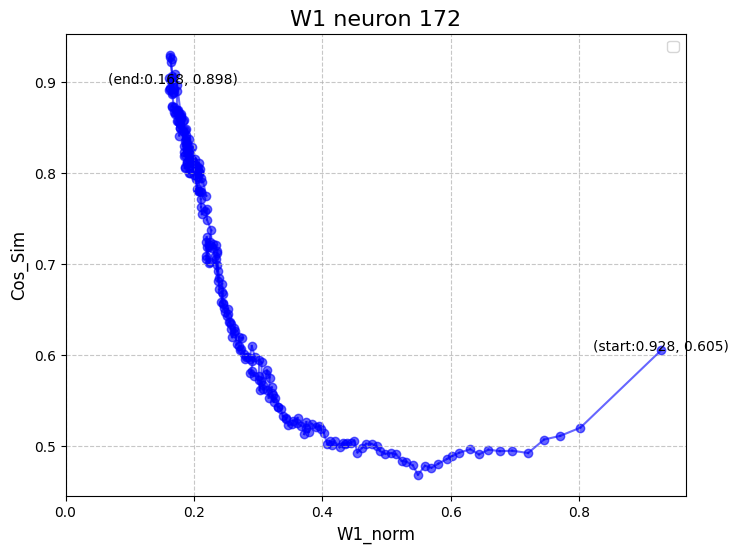

In [66]:
# norm and alignment corresponding to the neuron

for i in range(Spec_neuron_check_num):
     plt.figure(figsize=(8, 6))
     for j in range(1,check_num):
          plt.plot([W1_norm_list[j][W2_check_pos[i]],W1_norm_list[j - 1][W2_check_pos[i]]], [W1_cos_list[j][W2_check_pos[i]],W1_cos_list[j - 1][W2_check_pos[i]]],linestyle='-',  color='b', alpha=0.6)
     for j in range(check_num):
          plt.scatter(W1_norm_list[j][W2_check_pos[i]], W1_cos_list[j][W2_check_pos[i]], color='b', alpha=0.6)
     plt.annotate(f'(start:{W1_norm_list[0][W2_check_pos[i]]:.3f}, {W1_cos_list[0][W2_check_pos[i]]:.3f})',  
                 (W1_norm_list[0][W2_check_pos[i]], W1_cos_list[0][W2_check_pos[i]]),  
                 textcoords="offset points",     
                 xytext=(0, 0),        
                 ha='center',)   
     plt.annotate(f'(end:{W1_norm_list[check_num - 1][W2_check_pos[i]]:.3f}, {W1_cos_list[check_num - 1][W2_check_pos[i]]:.3f})',  
                 (W1_norm_list[check_num - 1][W2_check_pos[i]], W1_cos_list[check_num - 1][W2_check_pos[i]]),  
                 textcoords="offset points",     
                 xytext=(0, 0),        
                 ha='center',)  
     plt.title(f'W1 neuron {W2_check_pos[i]}', fontsize=16)
     plt.xlabel('W1_norm', fontsize=12)
     plt.ylabel('Cos_Sim', fontsize=12)

     plt.grid(True, linestyle='--', alpha=0.7)
     plt.xlim(0, )
     plt.legend()
     plt.show()

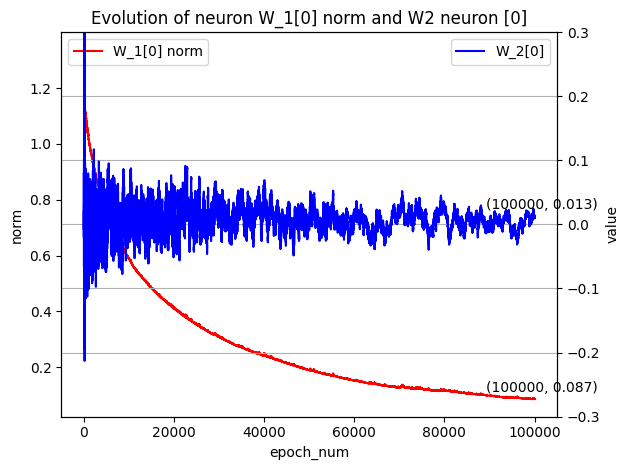

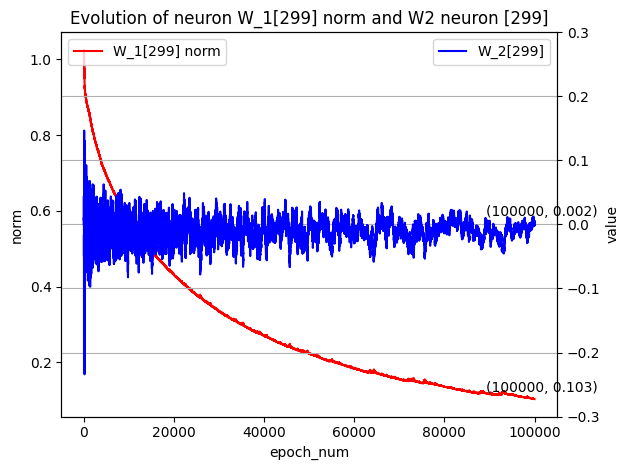

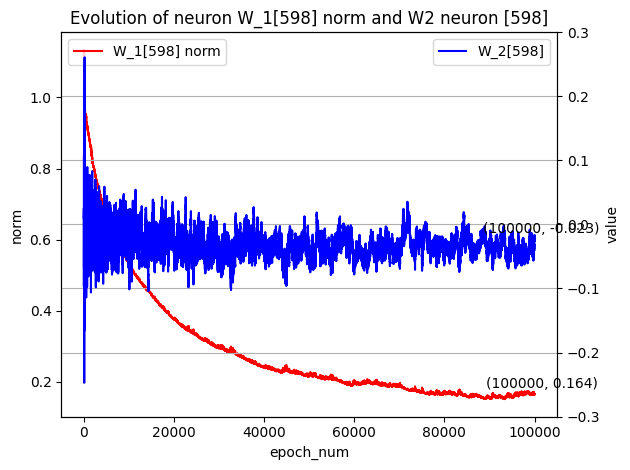

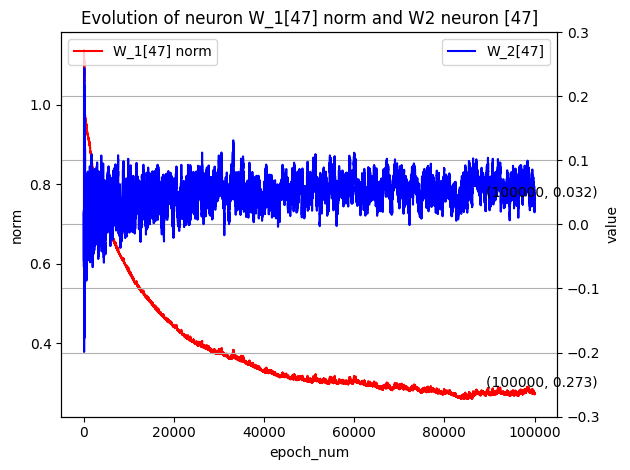

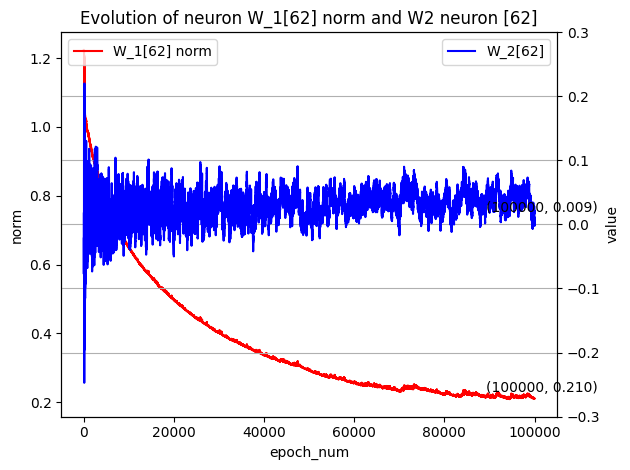

...

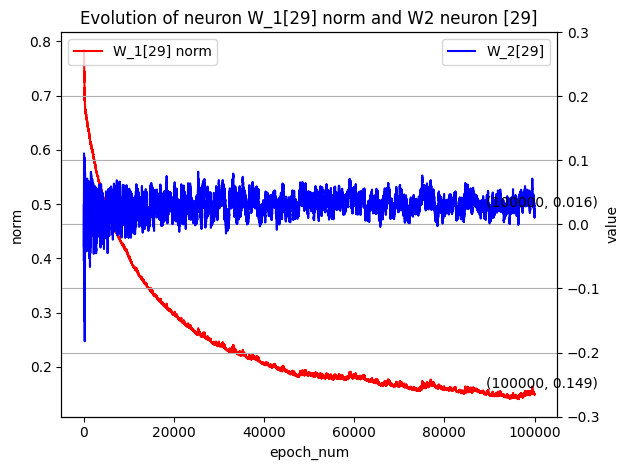

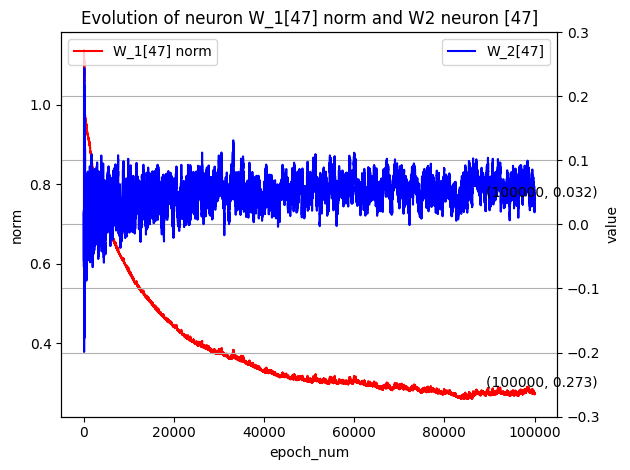

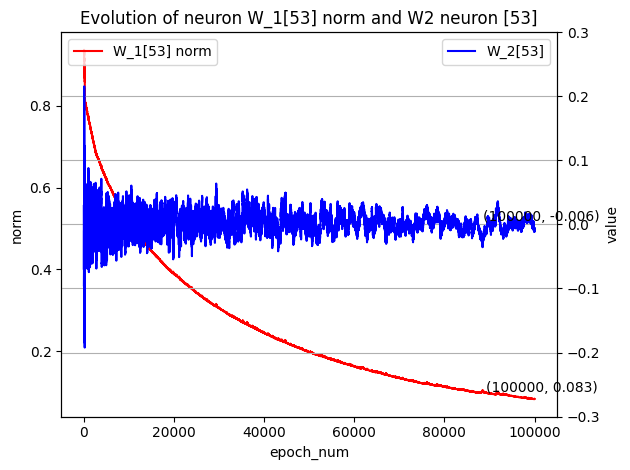

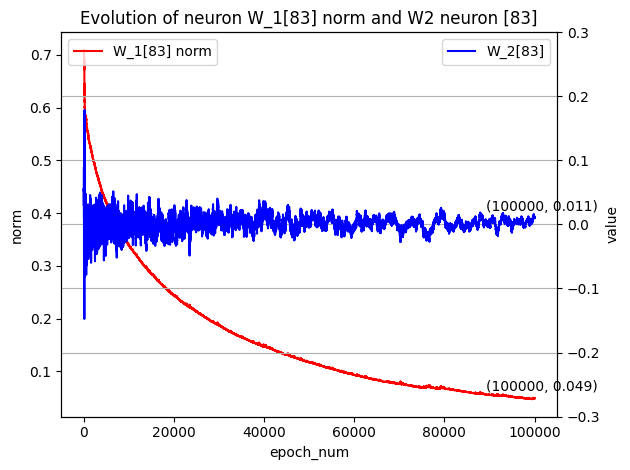

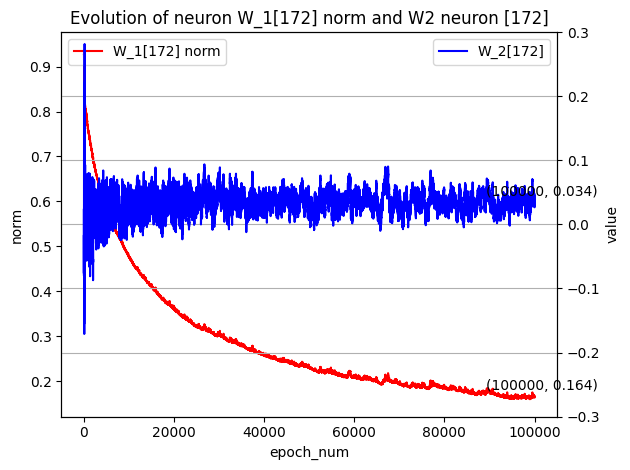

In [67]:
# Seperate norm corresponding to the neuron
test_start = 0
test_end = 100000
x = range(0, epoch_num + 1)
for i in range(Spec_neuron_check_num):
     fig, ax1 = plt.subplots()
     ax1.plot(x[test_start:test_end], W1_spec_norm[i][test_start:test_end], label=f'W_1[{W1_check_pos[i]}] norm', color='red')
     ax1.annotate(f'({x[epoch_num - 1]}, {W1_spec_norm[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W1_spec_norm[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax1.set_title(f'Evolution of neuron W_1[{W1_check_pos[i]}] norm and W2 neuron [{W2_check_pos[i]}]')
     ax1.set_xlabel('epoch_num')
     ax1.set_ylabel('norm')
     ax1.legend(loc="upper left")

   
     ax2 = ax1.twinx()
     ax2.plot(x[test_start:test_end], W2_check_list[i][test_start:test_end], label=f'W_2[{W2_check_pos[i]}]', color='blue')
     ax2.annotate(f'({x[epoch_num - 1]}, {W2_check_list[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W2_check_list[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax2.set_xlabel('epoch_num')
     ax2.set_ylabel('value')
     ax2.set_ylim(-0.3,0.3)

     ax2.legend(loc="upper right")
     ax2.grid(True)

     fig.tight_layout() 
     plt.show()

In [68]:
for i in range(Spec_neuron_check_num):
     p = []
     for k in range(100):
          p.append(W1_spec_norm[i][k * 20])
     print(W1_check_pos[i], p)

0 [1.3369513750076294, 1.3355307579040527, 1.326323390007019, 1.3092784881591797, 1.2673574686050415, 1.2473069429397583, 1.229085087776184, 1.2217252254486084, 1.2153890132904053, 1.1579527854919434, 1.1575772762298584, 1.145777940750122, 1.1432795524597168, 1.1225852966308594, 1.1166834831237793, 1.113852620124817, 1.1146422624588013, 1.1113536357879639, 1.1086843013763428, 1.108393669128418, 1.100502848625183, 1.0990885496139526, 1.0956227779388428, 1.0952199697494507, 1.0939170122146606, 1.0897761583328247, 1.0909786224365234, 1.0851116180419922, 1.0801382064819336, 1.0790841579437256, 1.0770241022109985, 1.071211576461792, 1.0707155466079712, 1.0676952600479126, 1.0659730434417725, 1.0652666091918945, 1.0587154626846313, 1.0584934949874878, 1.0554955005645752, 1.0510913133621216, 1.0481951236724854, 1.0462075471878052, 1.0441579818725586, 1.0416280031204224, 1.040326714515686, 1.0396065711975098, 1.0388846397399902, 1.0359143018722534, 1.0354504585266113, 1.0286575555801392, 1.029

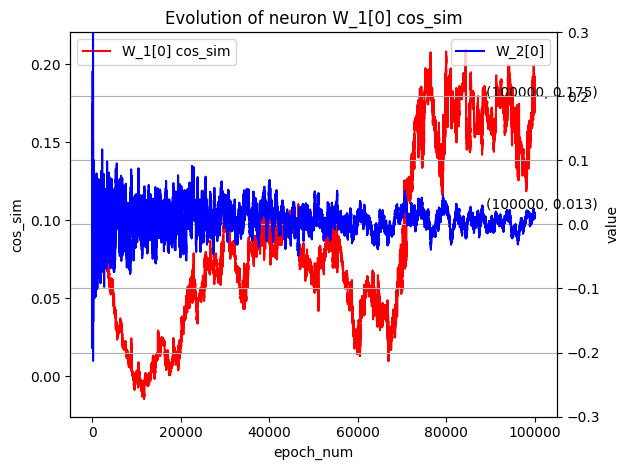

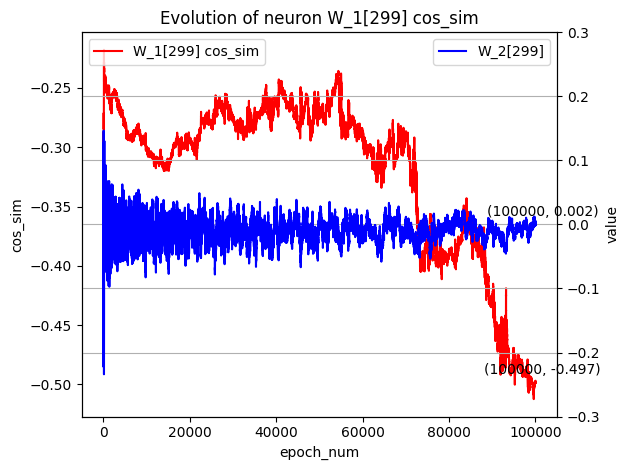

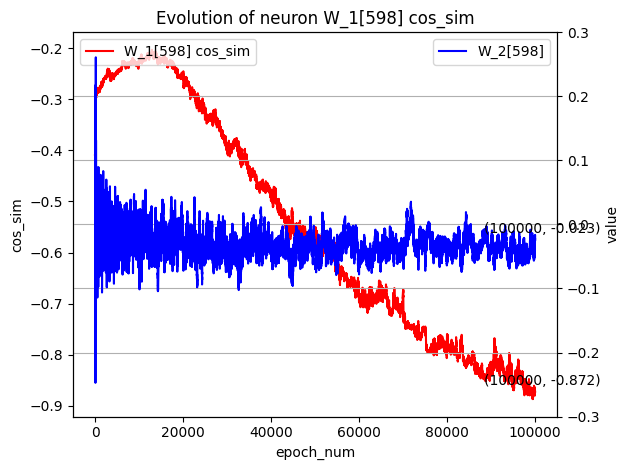

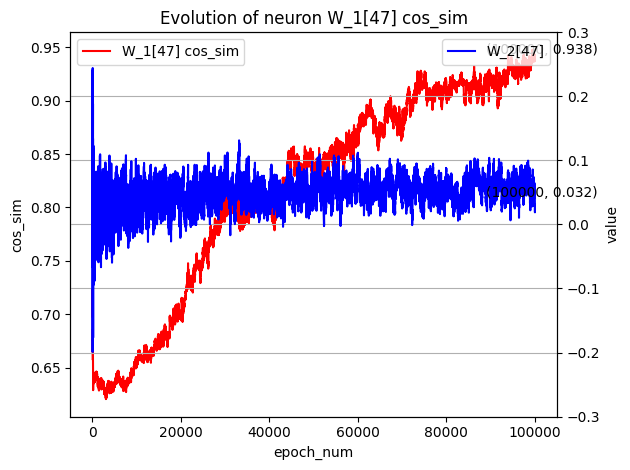

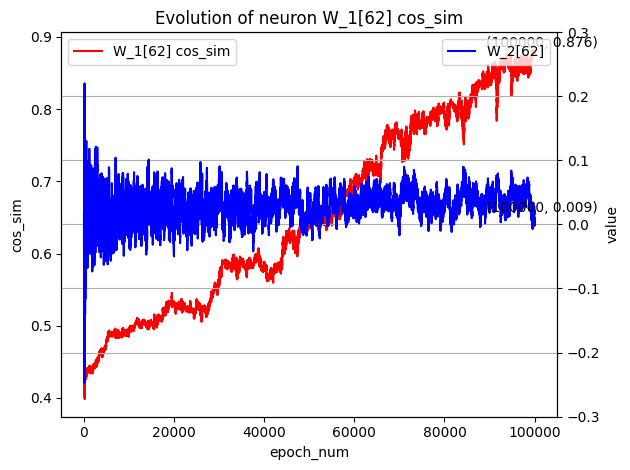

...

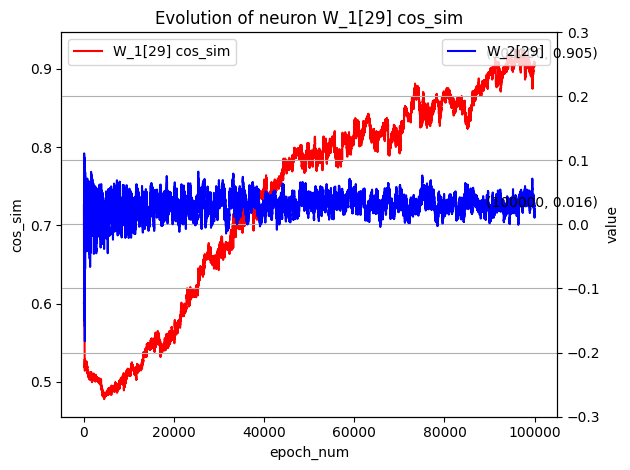

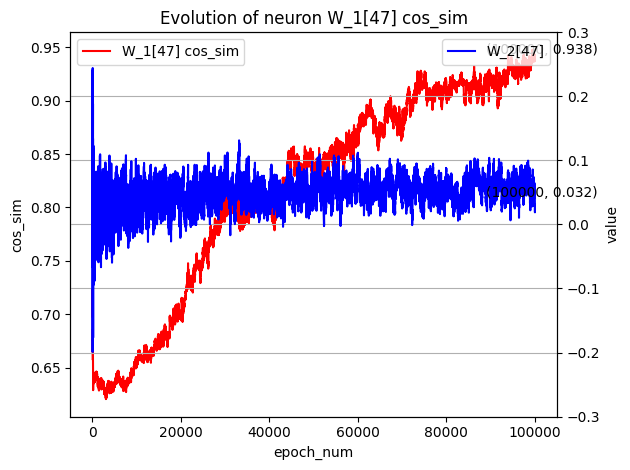

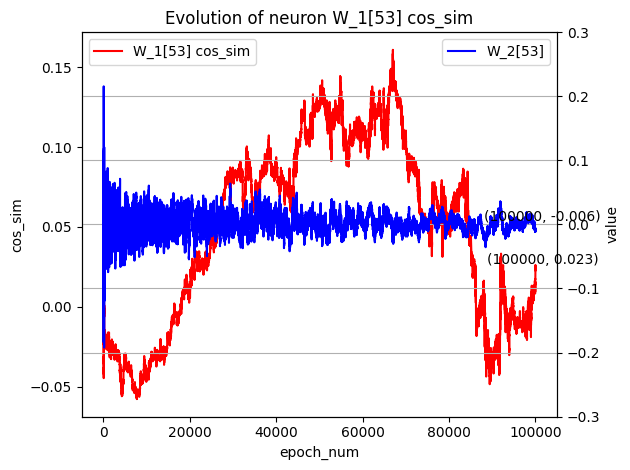

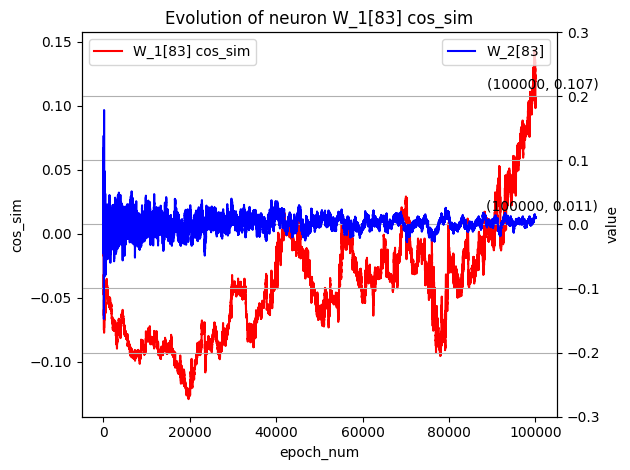

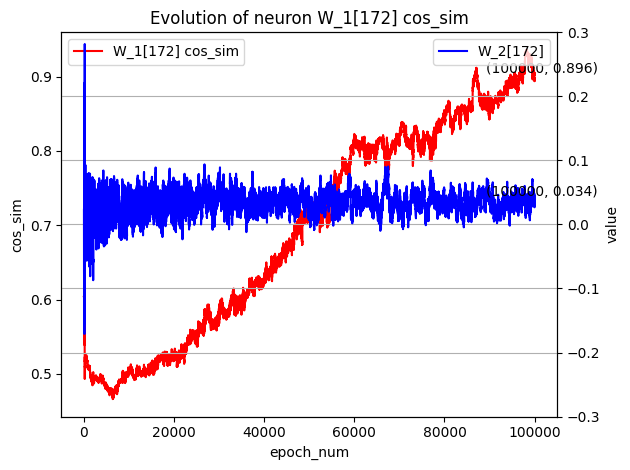

In [69]:
# Cos_sim corresponding to the neuron

x = range(0, epoch_num + 1)
for i in range(Spec_neuron_check_num):
     fig, ax1 = plt.subplots()
     ax1.plot(x, W1_spec_cossim[i], label=f'W_1[{W1_check_pos[i]}] cos_sim', color='red')
     ax1.annotate(f'({x[epoch_num - 1]}, {W1_spec_cossim[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W1_spec_cossim[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax1.set_title(f'Evolution of neuron W_1[{W1_check_pos[i]}] cos_sim')
     ax1.set_xlabel('epoch_num')
     ax1.set_ylabel('cos_sim')
     ax1.legend(loc="upper left")


     ax2 = ax1.twinx()
     ax2.plot(x, W2_check_list[i], label=f'W_2[{W2_check_pos[i]}]', color='blue')
     ax2.annotate(f'({x[epoch_num - 1]}, {W2_check_list[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W2_check_list[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax2.set_xlabel('epoch_num')
     ax2.set_ylabel('value')
     ax2.set_ylim(-0.3,0.3)
     ax2.legend(loc="upper right")
     ax2.grid(True)

     fig.tight_layout() 
     plt.show() 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


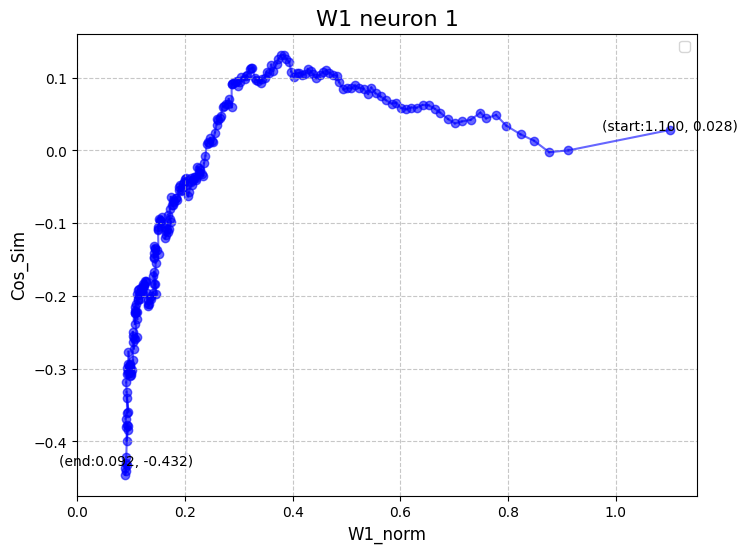

In [70]:
# norm and alignment corresponding to certain neuron
valid_point = 1
plt.figure(figsize=(8, 6))
for j in range(1,check_num):
     plt.plot([W1_norm_list[j][valid_point],W1_norm_list[j - 1][valid_point]], [W1_cos_list[j][valid_point],W1_cos_list[j - 1][valid_point]],linestyle='-',  color='b', alpha=0.6)
for j in range(check_num):
     plt.scatter(W1_norm_list[j][valid_point], W1_cos_list[j][valid_point], color='b', alpha=0.6)
plt.annotate(f'(start:{W1_norm_list[0][valid_point]:.3f}, {W1_cos_list[0][valid_point]:.3f})',  
               (W1_norm_list[0][valid_point], W1_cos_list[0][valid_point]),  
               textcoords="offset points",     
               xytext=(0, 0),        
               ha='center',)   
plt.annotate(f'(end:{W1_norm_list[check_num - 1][valid_point]:.3f}, {W1_cos_list[check_num - 1][valid_point]:.3f})',  
               (W1_norm_list[check_num - 1][valid_point], W1_cos_list[check_num - 1][valid_point]),  
               textcoords="offset points",     
               xytext=(0, 0),        
               ha='center',)  
plt.title(f'W1 neuron {valid_point}', fontsize=16)
plt.xlabel('W1_norm', fontsize=12)
plt.ylabel('Cos_Sim', fontsize=12)

plt.grid(True, linestyle='--', alpha=0.7)
plt.xlim(0, )
plt.legend()
plt.show()

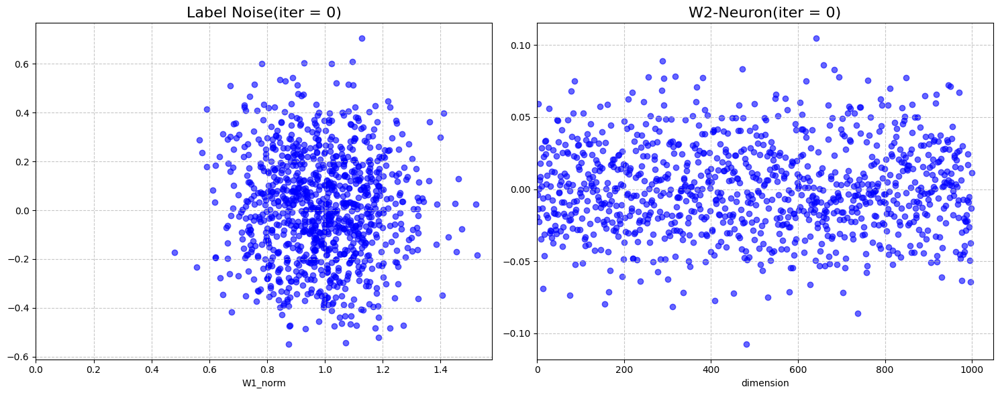

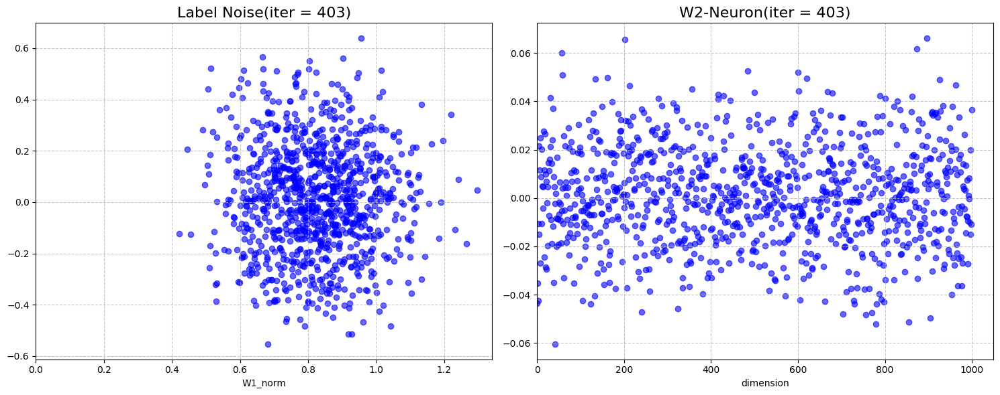

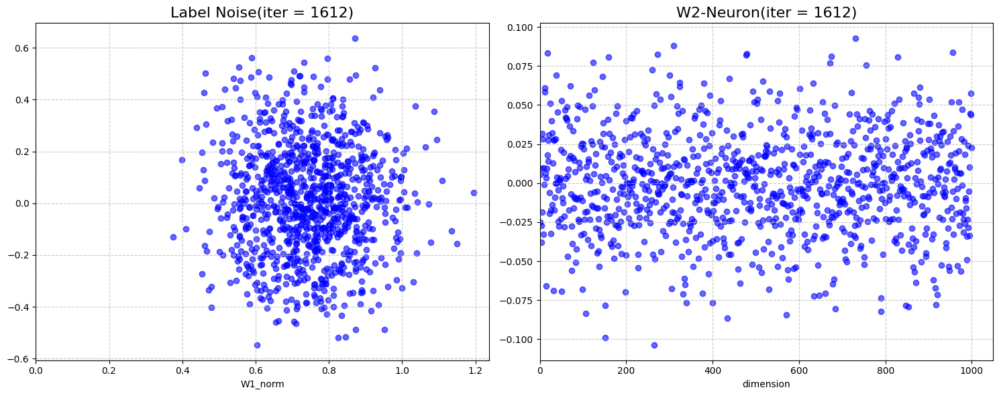

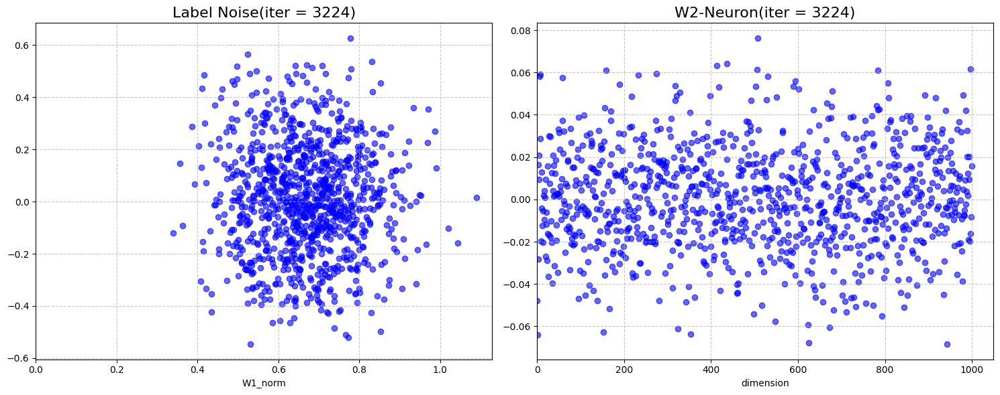

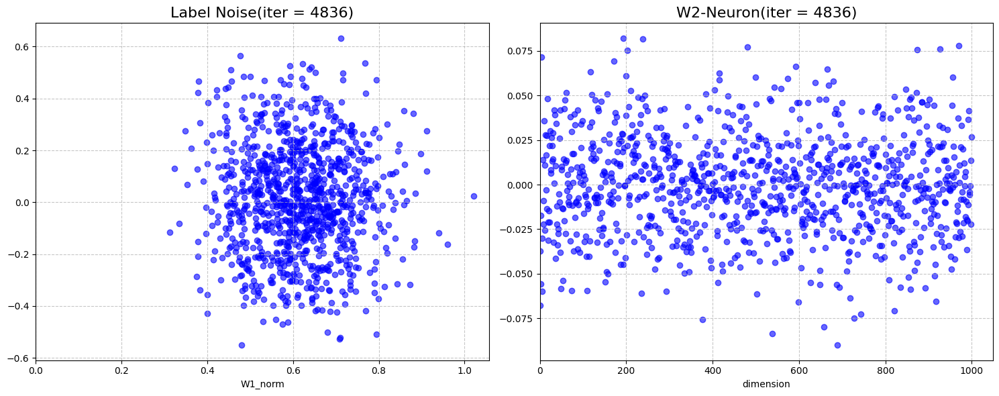

...

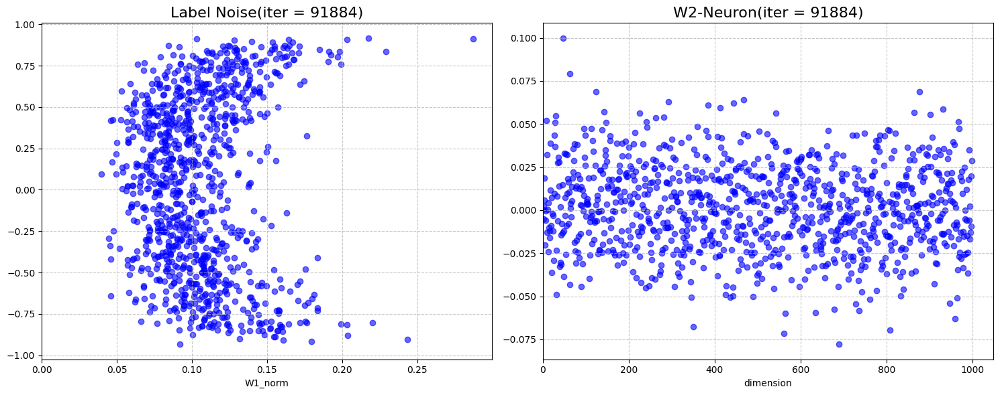

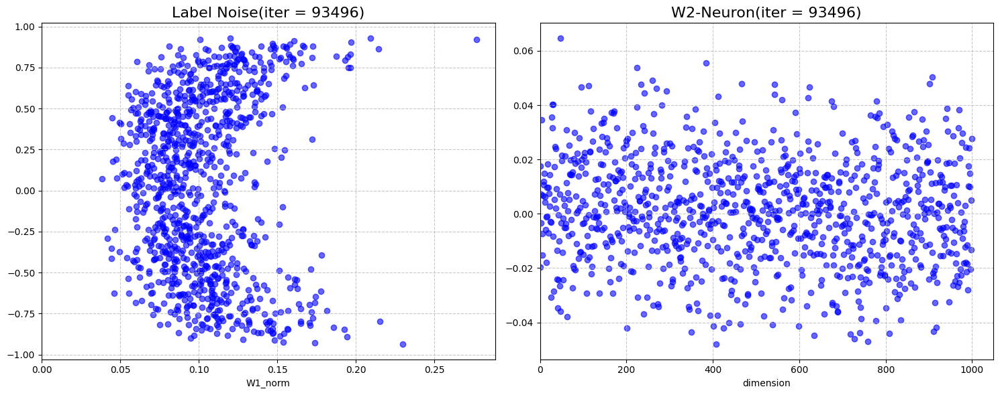

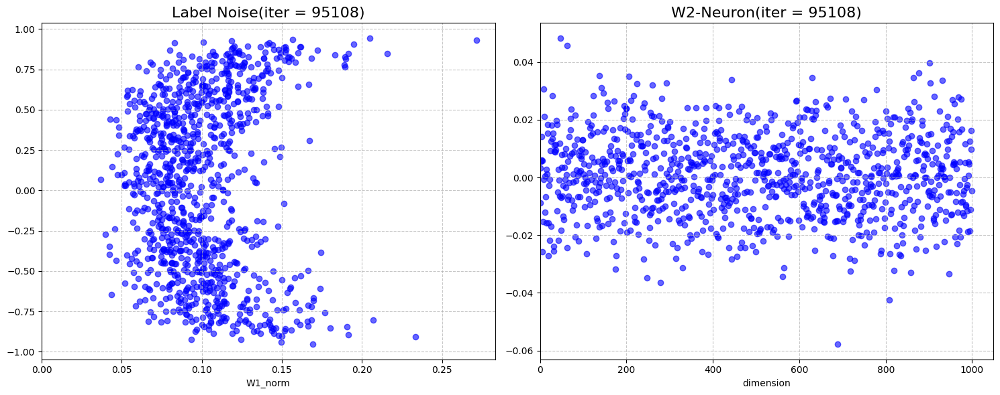

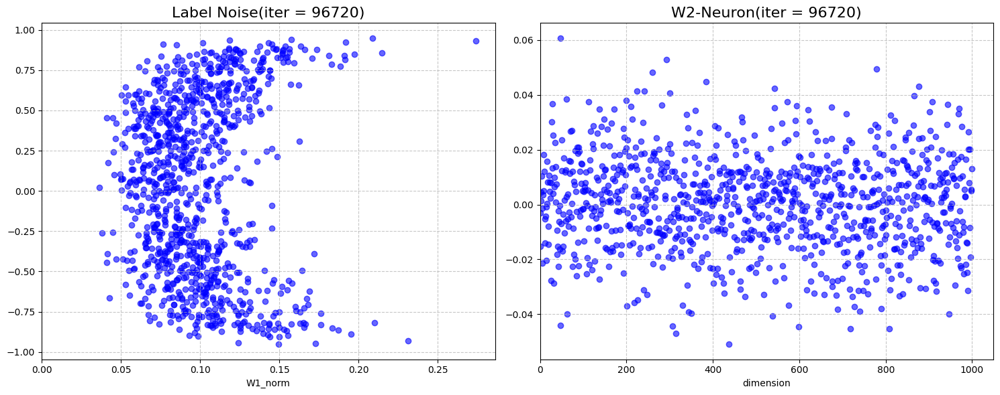

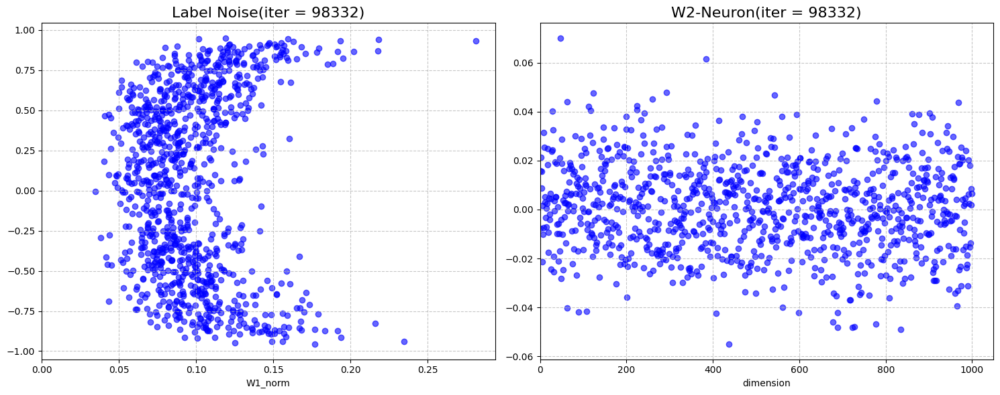

In [71]:
# # compare norm alignment with W2

for i in range(check_num):
     if i % 4 != 0 and i != 1:
          continue
     fig, axes = plt.subplots(1, 2, figsize = (15,6))  # 1行2列的子图
     axes[0].scatter(W1_norm_list[i], W1_cos_list[i], color='b', alpha=0.6)
     axes[0].set_title(f'Label Noise(iter = {check_pos[i]})',fontsize=16)
     axes[0].grid(True, linestyle='--', alpha=0.7)
     axes[0].set_xlim(left=0)
     axes[0].set_xlabel("W1_norm")

     axes[1].scatter(W2_x, W2_list[i], color='b', alpha=0.6)
     axes[1].set_title(f'W2-Neuron(iter = {check_pos[i]})', fontsize=16)
     axes[1].grid(True, linestyle='--', alpha=0.7)
     axes[1].set_xlim(left=0)
     axes[1].set_xlabel("dimension")

     plt.tight_layout()
     plt.show()